# Assignment 1 (Coding Part)

- Implement the required code for each problem in the allocated area.
- Write down your comments clearly.
- Please submit your notebook with outputs displayed.

### imports

In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt

### consts

In [2]:
N_COINS= 1000
N_FLIPS= 10
MU = 0.5

## Exercise 1.10

In [3]:
def flip_coin():
    return random.choice([0,1])

### Exercise 1.10 (a)

In [4]:
# TODO: add solution for point a
'''
we know that mu means the probaility of getting head over the entire population and since we are using a fair coin, mu = 0.5
for the 3 coins
'''

'\nwe know that mu means the probaility of getting head over the entire population and since we are using a fair coin, mu = 0.5\nfor the 3 coins\n'

### Exercise 1.10 (b)

In [47]:
# TODO: add solution for point b

def entire_experiment(n_coins = N_COINS,n_flips=N_FLIPS):
    heads = np.zeros((n_coins,n_flips))
    for i in range(n_coins):
        for j in range(n_flips):
            heads[i,j] = flip_coin()
    
    # get the index of the coin that got the fist head
    first_heads = np.argmax(heads[:,0])
    # get the coin that got minimum number of heads
    min_heads = np.argmin(np.sum(heads,axis=1))
    # choose random coin
    random_coin = random.choice(range(n_coins))
    # get the fraction of heads for the coin that got the first head
    v1 = np.mean(heads[first_heads])
    # get the fraction of heads for the coin that got the minimum number of heads
    v_min = np.mean(heads[min_heads])
    # get the fraction of heads for the random coin
    v_rand = np.mean(heads[random_coin])
    
    return (first_heads,v1),(min_heads,v_min),(random_coin,v_rand)
    

[1. 0. 0. 0. 1. 1. 1. 1. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 1. 1. 1. 0. 0. 0. 1.]
[1. 1. 0. 1. 1. 1. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 1. 0. 1. 1. 0. 1. 1. 0.]
[1. 0. 0. 1. 0. 0. 1. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
[1. 1. 1. 0. 1. 0. 0. 1. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 1. 0. 0. 1. 1. 0. 1. 0.]
[1. 1. 1. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
[0. 0. 0. 1. 1. 1. 0. 0. 1. 1.]
[1. 1. 1. 0. 1. 1. 0. 1. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 1. 1. 1. 0. 0. 1. 0. 1.]
[1. 0. 1. 1. 1. 0. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 0. 1. 0. 1. 0. 1. 0.]
[1. 1. 1. 1. 1. 1. 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 1. 1. 1. 1. 1. 1. 0. 0. 0.]
[1. 0. 1. 1. 0. 1. 1. 1. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 1. 0. 0. 1. 1. 0. 1.]
[1. 1. 1. 1. 0. 0. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 1. 0. 1. 0. 1. 0. 1. 1. 0.]
[1. 1. 1. 1. 1. 1. 0. 0. 0. 1.]
[0. 0. 0

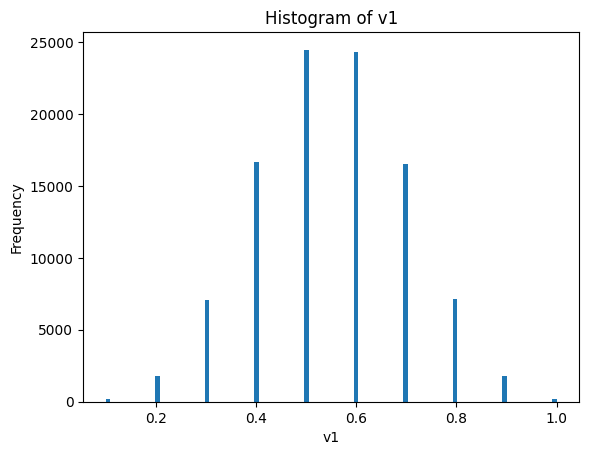

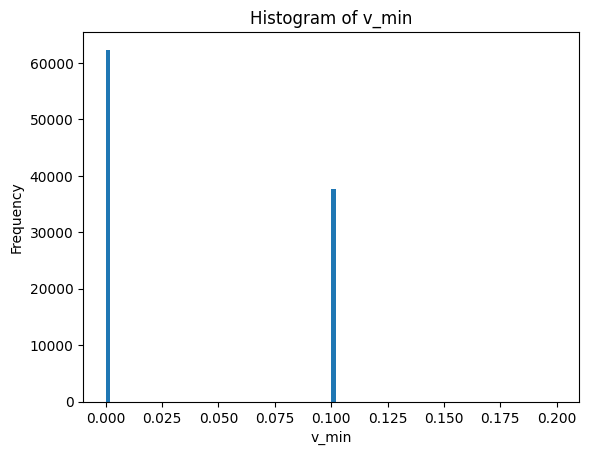

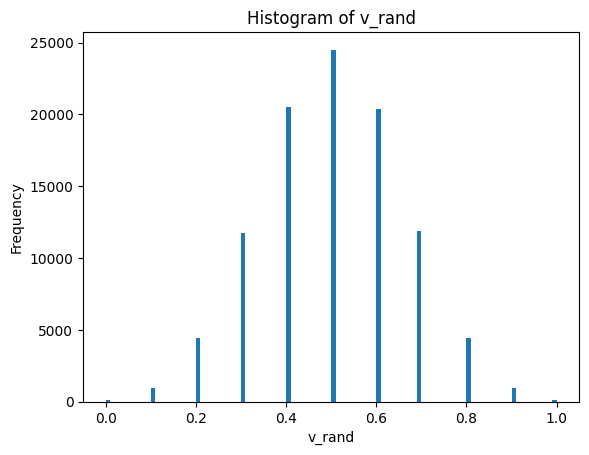

In [42]:
v1_list = []
v_min_list = []
v_rand_list = []
n_bins = 100

# run the experiment 10^5 times
for i in range(10**5):
    v1 , v_min , v_rand = entire_experiment()
    v1_list.append(v1[1])
    v_min_list.append(v_min[1])
    v_rand_list.append(v_rand[1])
    
# draw the histogram for each of the 3 coins
plt.hist(v1_list,bins=n_bins)
plt.xlabel('v1')
plt.ylabel('Frequency')
plt.title('Histogram of v1')
plt.show()

plt.hist(v_min_list,bins=n_bins)
plt.xlabel('v_min')
plt.ylabel('Frequency')
plt.title('Histogram of v_min')
plt.show()

plt.hist(v_rand_list,bins=n_bins)
plt.xlabel('v_rand')
plt.ylabel('Frequency')
plt.title('Histogram of v_rand')
plt.show()

### Exercise 1.10 (c)

In [43]:
# this fucntion to calculate Hoeffding inequality
def hoeffding_inequality(epslion,n):
    return 2*np.exp(-2*(epslion**2)*n)

In [44]:
# this function is to calculate the actual error
def actual_error(v,epsilon):
    return (abs(v-MU) > epsilon).mean()

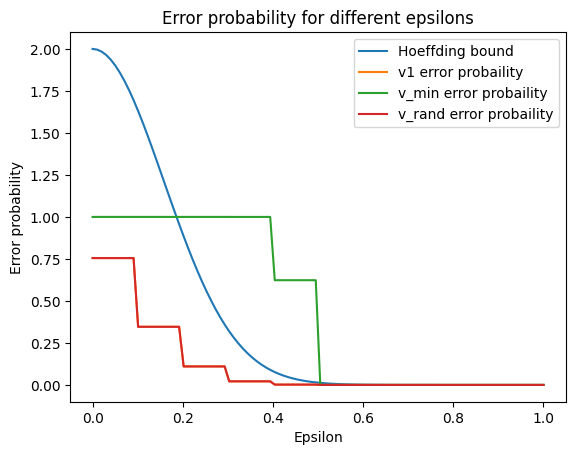

In [45]:
# TODO: add solution for point c

# create a list of epsilons from 0 to 1 with 100 elements in total 
espilons = np.linspace(0,1,100)

hoeffding_inequality_list = []
actual_error_v1 = []
actual_error_v_min = []
actual_error_v_rand = []
for espilon in espilons:
    hoeffding_inequality_list.append(hoeffding_inequality(espilon,N_FLIPS))
    actual_error_v1.append(actual_error(np.array(v1_list),espilon))
    actual_error_v_min.append(actual_error(np.array(v_min_list),espilon))
    actual_error_v_rand.append(actual_error(np.array(v_rand_list),espilon))
    
# draw the graph of Hoeffding inequality, and the actual error for each of the 3 coins
plt.plot(espilons,hoeffding_inequality_list,label="Hoeffding bound")
plt.plot(espilons,actual_error_v1,label="v1 error probaility")
plt.plot(espilons,actual_error_v_min,label="v_min error probaility")
plt.plot(espilons,actual_error_v_rand,label="v_rand error probaility")
plt.xlabel('Epsilon')
plt.ylabel('Error probability')
plt.title('Error probability for different epsilons')
plt.legend(loc='upper right')
plt.show()




### Exercise 1.10 (d)

In [46]:
# TODO: add solution for point d
''' 
as shown in the plot v_1 and v_rand obey the Hoeffding bound but v_min does not obey the Hoeffding bound 
because it is the minimum of the samples so it will be the farthest from the mean of the population which is 0.5
'''

' \nas shown in the plot v_1 and v_rand obey the Hoeffding bound but v_min does not obey the Hoeffding bound \nbecause it is the minimum of the samples so it will be the farthest from the mean of the population which is 0.5\n'

### Exercise 1.10 (e)

In [ ]:
# TODO: add solution for point e
'''
The mapping from the coins to the bins is as follows:
    c_1: is the bin that gives the first red ball
    c_min: is the bin that gives the minimum number of red balls
    c_rand: is the bin that is chosen randomly

    so flipping a coin is like choosing a ball from the bin and the color of the ball is the result of the flip
    and the fraction of red balls in the bin is the fraction of heads in the coin
    and the mean of the population is the mean of the color of the balls in the bin
'''

## Problem 1.4

### Problem 1.4 (a)

In [ ]:
def generate_dataset():
    # TODO:  Generate a linearly separable data set of size 20 where d=2
    # generate 20 random points
    X = np.random.uniform(-1,1,(20,2))

### Problem 1.4 (b)

In [ ]:
def run_perceptron_learning():
    # TODO: add perceptron learning algorithm code

In [ ]:
# TODO: add solution for the rest of the point

### Problem 1.4 (c)

In [ ]:
# TODO: add solution for point c

### Problem 1.4 (d)

In [ ]:
# TODO: add solution for point d

### Problem 1.4 (e)

In [ ]:
# TODO: add solution for point e